
# Video QR code analysis 

---




The analysis is done using one Multiplexed QR code. This process will be scaled for the number of QR code present in a video. Each image will be processed for noise and distortions.

In [ ]:

!pip install svglib
!pip install svgwrite
 


from cgi import test
from ctypes import sizeof
from numpy import char
import svgwrite
from svgwrite import cm, mm  
import svglib 
import os
from svglib.svglib import svg2rlg
from reportlab.graphics import renderPM
import cv2
import zlib
from google.colab.patches import cv2_imshow
import time
from timeit import default_timer as timer


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


>[Video QR code analysis](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=Ky_7d638JenL)

>[Generating QR](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=0ej9Zc7EFztL)

>>[Designing Algo for displaying QR code in SVG](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=eKki0NUjixWq)

>>[Designing Algo for svg to png](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=-UXpPFevkjqa)

>>[Compressing Data](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=wz0UOb278Glo)

>>[Main function](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=XUNTscfwk_cB)

>>[Showing color QR code](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=X7p4zz2rsVO4)

>>[Showing multiplex QR code](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=At-j2Nj_sKa6)

>[Designing a degradation function](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=2rHq-0zCGEKx)

>>[Adding noise](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=8IFrWWBnR-Rx)

>[Reciever end processing](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=B5bYMrS5GqXQ)

>>[Demux](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=KKdRZdIHG7h5)

>[Gausian smoothing](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=VOUDij-tSGUB)

>>[Edge detection using laplacien](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=4wBH19fOG6YR)

>>[Getting Values from QR](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=PI_T92BuHXZB)

>>[Decompressing data](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=aMkaPX96HdX5)

>>[Comparing data](#updateTitle=true&folderId=1bgv3plyCLfKU_qdVy2BI7G109UrDC4IP&scrollTo=MNmWxTexHmn4)



##Data being used for Testing purposes

In [ ]:
file = open("data.txt","w") 
 
file.write("When Mr. Bilbo Baggins of Bag End announced that he would shortly be celebrating his eleventy-first birthday with a party of special magnificence, there was much talk and excitement in Hobbiton. Bilbo was very rich and very peculiar, and had been the wonder of the Shire for sixty years, ever since his remarkable disappearance and unexpected return. The riches he had brought back from his travels had now become a local legend, and it was popularly believed, whatever the old folk might say, that the Hill at Bag End was full of tunnels stuffed with treasure. And if that was not enough for fame, there was also his prolonged vigour to marvel at. Time wore on, but it seemed to have little effect on Mr. Baggins. At ninety he was much the same as at fifty. At ninety-nine they began to call himwell -preserved, butunchanged would have been nearer the mark. There were some that shook their heads and thought this was too much of a good thing; it seemed unfair that anyone should possess (apparently) perpetual youth as well as (reputedly) inexhaustible wealth. It will have to be paid for, they said. It isn't natural, and trouble will come of it! But so far trouble had not come; and as Mr. Baggins was generous with his money, most people were willing to forgive him his oddities and his good fortune. He remained on visiting terms with his relatives (except, of course, the Sackville-Bagginses), and he had many devoted admirers among the hobbits of poor and unimportant families. But he had no close friends, until some of his younger cousins began to grow up. The eldest of these, and Bilbo's favourite, was young Frodo Baggins. When Bilbo was ninety-nine, he adopted Frodo as his heir, and brought him to live at Bag End; and the hopes of the Sackville-Bagginses were finally dashed. Bilbo and Frodo happened to have the same birthday, September 22nd. You had better come and live here, Frodo my lad, said Bilbo one day; 'and then we can celebrate our birthday-parties comfortably together. At that time Frodo was still in histweens, as the hobbits called the irresponsible twenties between childhood and coming of age at thirty-three. Twelve more years passed. Each year the Bagginses had given very lively combined birthday-parties at Bag End; but now it was understood that something quite exceptional was being planned for that autumn. Bilbo was going to beeleventy-one, 111, a rather curious number and a very respectable age for a hobbit (the Old Took himself had only reached 130); and Frodo was going to bethirty-three, 33) an important number: the date of his 'coming of age'. Tongues began to wag in Hobbiton and Bywater; and rumour of the coming event travelled all over the Shire. The history and character of Mr. Bilbo Baggins became once again the chief topic of conversation; and the older folk suddenly found their reminiscences in welcome demand. No one had a more attentive audience than old Ham Gamgee, commonly known as the Gaffer. He held forth atThe Ivy Bush , a small inn on the Bywater road; and he spoke with some authority, for he had tended the garden at Bag End for forty years, and had helped old Holman in the same job before that. Now that he was himself growing old and stiff in the joints, the job was mainly carried on by his youngest son, Sam Gamgee. Both father and son were on very friendly terms with Bilbo and Frodo. They lived on the Hill itself, in Number 3 Bagshot Row just below Bag End. A very nice well-spoken gentlehobbit is Mr. Bilbo, as I've always said, the Gaffer declared. With perfect truth: for Bilbo was very polite to him, calling him Master Hamfast', and consulting him constantly upon the growing of vegetables - in the matter of 'roots', especially potatoes, the Gaffer was recognized as the leading authority by all in the neighbourhood (including himself). But what about this Frodo that lives with him? asked Old Noakes of Bywater. Baggins is his name, but he's more than half a Brandybuck, they say. It beats me why any Baggins of Hobbiton should go looking for a wife away there in Buckland, where folks are so queer. And no wonder they're queer, put in Daddy Twofoot (the Gaffer's nextdoor neighbour), 'if they live on the wrong side of the Brandywine River, and right agin the Old Forest. That's a dark bad place, if half the tales be true. You're right, Dad! said the Gaffer. Not that the Brandybucks of Buckland livein the Old Forest; but they're a queer breed, seemingly. They fool about with boats on that big river - and that isn't natural.") 

file.close()

#Generating QR

##Designing Algo for displaying QR code in SVG
> The reason we are desiging our own QR code algorithim is for numerous reasons:

1.   Different Compression algorithim can be used (Huffman)
2.   Remove redundant checks that are only necessary for pritable QR codes 
3.   Change size of pixels to best suit for our edge detection algo
4.   Can scale QR code to as large or small as we require



In [ ]:
def basic_shapes(lst,n,color,name="test.svg" ):
   # Drawing grid
    dwg = svgwrite.Drawing(filename=name, debug=True,size=(1450,1450))
    dwg.add(dwg.rect(insert=(0, 0), size=('100%', '100%'), rx=None, ry=None, fill='rgb(0,0,0)'))

    hlines = dwg.add(dwg.g(id='hlines', stroke='white'))
    for y in range(n-1):
        hlines.add(dwg.line(start=(2*int(1400/50)-16, (2+y)*int(1400/50)-16), end=(n*int(1400/50)-16, -16+(2+y)*int(1400/50))))
    vlines = dwg.add(dwg.g(id='vline', stroke='white'))
    for x in range(n-1):
        vlines.add(dwg.line(start=((2+x)*int(1400/50)-16, 2*int(1400/50)-16), end=((2+x)*int(1400/50)-16, -16+n*int(1400/50))))
    
    
    shapes = dwg.add(dwg.g(id='shapes', fill='red'))
    
    #Drawing points 
    for i in range(len(lst)):
        for j in range(len(lst[1])):
            
            if(lst[i][j]):
                shapes.add(dwg.rect(insert=((j*int(1400/50)+42), (i*int(1400/50)+42)), size=(25, 25),fill=color, stroke_width=0))
    dwg.save()

    

##Generating filter

In [ ]:
def makefilter(n):
   # Drawing grid
    name="Filter.svg"
    color = "white"
    dwg = svgwrite.Drawing(filename=name, debug=True,size=(1450,1450))
    dwg.add(dwg.rect(insert=(0, 0), size=('100%', '100%'), rx=None, ry=None, fill='rgb(0,0,0)'))

    shapes = dwg.add(dwg.g(id='shapes', fill='red'))
    lst =[]
    lst2=[]
    for i in range(n-2):
      for j in range(n-2):
          lst2.append(1)
      lst.append(lst2)
      lst2=[]
    #Drawing points 
    for i in range(len(lst)):
        for j in range(len(lst[1])):
            
            if(lst[i][j]):
                shapes.add(dwg.rect(insert=((j*int(1400/50)+50), (i*int(1400/50)+50)), size=(10, 10),fill=color, stroke_width=0))

    
    dwg.save()
    print("Filter made")

## Designing Algo for svg to png 
>The reason for SVG  is that we require a scalable QR code that then can be converted in to png for the video.

In [ ]:
def make():

    # Conversion
    drawing = svg2rlg('File1.svg')
    renderPM.drawToFile(drawing, 'File1.png', fmt='PNG')  
    drawing1 = svg2rlg('File2.svg')
    renderPM.drawToFile(drawing1, 'File2.png', fmt='PNG')
    drawing2 = svg2rlg('File3.svg')
    renderPM.drawToFile(drawing2, 'File3.png', fmt='PNG')
    drawing2 = svg2rlg('Filter.svg')
    renderPM.drawToFile(drawing2, 'Filter.png', fmt='PNG')
    #Multiplexing 
    img1 = cv2.imread('File1.png')
    img2 = cv2.imread('File2.png')
    img3 = cv2.imread('File3.png')
    cv2.waitKey(0)
    dst1= cv2.add(img1,img2)
    dst = cv2.addWeighted(img1,0.9,img2,0.8,0)
    dst = cv2.addWeighted(dst,0.9,img3,0.7,0)
    cv2.imwrite('ff'+'.png', dst)
    
    
    


## Compressing Data

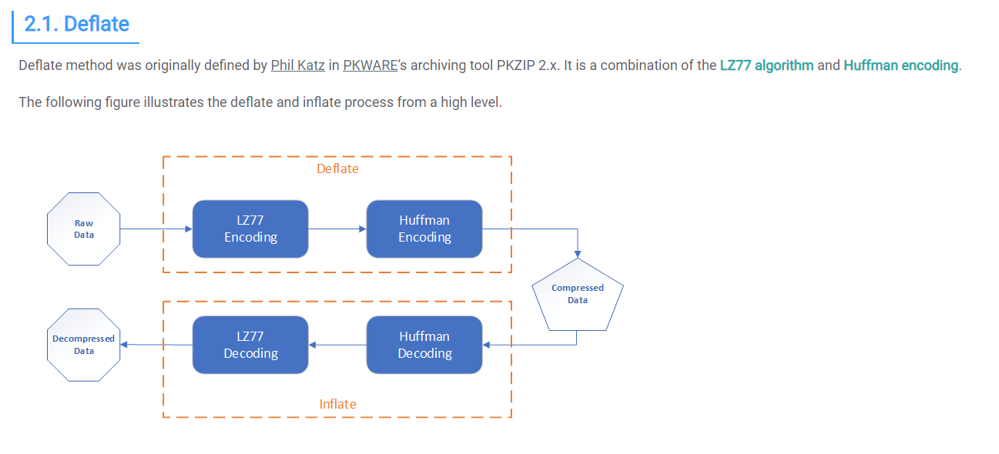

In [ ]:
def compress(data):
  data = bytes(data,"utf-8")
  t = zlib.compress(data)
  x= list(t)
  bit_list=[]
  for i in x: 
      bit_list.append(format(i,'08b'))

  bit_stream= ''.join(bit_list)
  
  print("Bit stream: "+  bit_stream)
  print("Size before compression: " + str(len(data)*8))
  print("Size after compression: " + str(len(bit_stream)))
  return (bit_stream)

x=compress("When Mr. Bilbo Baggins of Bag End announced that he would shortly be celebrating his eleventy-first birthday with a party of special magnificence, there was much talk and excitement in Hobbiton. Bilbo was very rich and very peculiar, and had been the wonder of the Shire for sixty years, ever since his remarkable disappearance and unexpected return. The riches he had brought back from his travels had now become a local legend, and it was popularly believed, whatever the old folk might say, that the Hill at Bag End was full of tunnels stuffed with treasure. And if that was not enough for fame, there was also his prolonged vigour to marvel at. Time wore on, but it seemed to have little effect on Mr. Baggins. At ninety he was much the same as at fifty. At ninety-nine they began to call himwell -preserved, butunchanged would have been nearer the mark. There were some that shook their heads and thought this was too much of a good thing; it seemed unfair that anyone should possess (apparently) perpetual youth as well as (reputedly) inexhaustible wealth. It will have to be paid for, they said. It isn't natural, and trouble will come of it! But so far trouble had not come; and as Mr. Baggins was generous with his money, most people were willing to forgive him his oddities and his good fortune. He remained on visiting terms with his relatives (except, of course, the Sackville-Bagginses), and he had many devoted admirers among the hobbits of poor and unimportant families. But he had no close friends, until some of his younger cousins began to grow up. The eldest of these, and Bilbo's favourite, was young Frodo Baggins. When Bilbo was ninety-nine, he adopted Frodo as his heir, and brought him to live at Bag End; and the hopes of the Sackville-Bagginses were finally dashed. Bilbo and Frodo happened to have the same birthday, September 22nd. You had better come and live here, Frodo my lad, said Bilbo one day; 'and then we can celebrate our birthday-parties comfortably together. At that time Frodo was still in histweens, as the hobbits called the irresponsible twenties between childhood and coming of age at thirty-three. Twelve more years passed. Each year the Bagginses had given very lively combined birthday-parties at Bag End; but now it was understood that something quite exceptional was being planned for that autumn. Bilbo was going to beeleventy-one, 111, a rather curious number and a very respectable age for a hobbit (the Old Took himself had only reached 130); and Frodo was going to bethirty-three, 33) an important number: the date of his 'coming of age'. Tongues began to wag in Hobbiton and Bywater; and rumour of the coming event travelled all over the Shire. The history and character of Mr. Bilbo Baggins became once again the chief topic of conversation; and the older folk suddenly found their reminiscences in welcome demand. No one had a more attentive audience than old Ham Gamgee, commonly known as the Gaffer. He held forth atThe Ivy Bush , a small inn on the Bywater road; and he spoke with some authority, for he had tended the garden at Bag End for forty years, and had helped old Holman in the same job before that. Now that he was himself growing old and stiff in the joints, the job was mainly carried on by his youngest son, Sam Gamgee. Both father and son were on very friendly terms with Bilbo and Frodo. They lived on the Hill itself, in Number 3 Bagshot Row just below Bag End. A very nice well-spoken gentlehobbit is Mr. Bilbo, as I've always said, the Gaffer declared. With perfect truth: for Bilbo was very polite to him, calling him Master Hamfast', and consulting him constantly upon the growing of vegetables - in the matter of 'roots', especially potatoes, the Gaffer was recognized as the leading authority by all in the neighbourhood (including himself). But what about this Frodo that lives with him? asked Old Noakes of Bywater. Baggins is his name, but he's more than half a Brandybuck, they say. It beats me why any Baggins of Hobbiton should go looking for a wife away there in Buckland, where folks are so queer. And no wonder they're queer, put in Daddy Twofoot (the Gaffer's nextdoor neighbour), 'if they live on the wrong side of the Brandywine River, and right agin the Old Forest. That's a dark bad place, if half the tales be true. You're right, Dad! said the Gaffer. Not that the Brandybucks of Buckland livein the Old Forest; but they're a queer breed, seemingly. They fool about with boats on that big river - and that isn't natural. ")


Bit stream: 0111100010011100011001010101100001001101100100111101101110110110000100101111110000101011110010000100100110111011010101010101110001010111000111001101111110110010100001110101011111011001110010101000011101111101100010000101001100010101101110111100101011110101100011101010000000000000100100101011000001000000100000000000000101000000110010011100110010101111010011111111011100000000100101000110010011111011111000101001010101000100000100000011001111010011110100111101001100110011111000110100111110010011000011011110101011001111111101000100101010111101001110001101111101000111111101011010001011000111110100011000010110101100111000101100000010001111111010101011011101100000100101000000111000100001101011101110000101101000100011010010101010010011001011100110101010110010111010100001001001010111011011110101010010011110011000100010101001111110010100111011110101010101010001111110101101101101100111110111010001110001011000010101010010010011110010110000101001011111110011110011011010010100111011010110

## Main function 

In [ ]:
def main():
    color="blue"
    name= "File1.svg"
    n=50
    f = open("data.txt", "r")
    test_str = f.read(1800)
    lst =[]
    lst2=[]
   
    val = compress(test_str) # compressing data
    val =''.join(format(ord(i), '08b') for i in test_str)
    print(test_str)
   ## Getting a matrix for displaying svg    ----------- Blue QR 
    for i in range(n-2):
        for j in range(n-2):
            index = (i*(n-2))+j
            if ( index < len(val)):
                lst.append(int(val[index]))
            else:
                lst.append(0)
        lst2.append(lst)
        lst=[]
    basic_shapes(lst2,n,color,name)
    print("for blue the data is: "+val[0:index])
    print("for red the data is: "+val[index:index+index])
    print("for green the data is: "+val[index+index:index+index+index])

    val =val[index::]
   
    ## Getting a matrix for displaying svg    ----------- Red QR
    lst2=[]
    lst=[]
    color = "red"
    name = "File2.svg"
    print(len(val))
    if (len(val) > index): # check if there is more data to add in QR code 

        for i in range(n-2):
            for j in range(n-2):
                index = (i*(n-2))+j
                if ( index < len(val)):
                    lst.append(int(val[index]))
                else:
                    lst.append(0)
            lst2.append(lst)
            lst=[]
        basic_shapes(lst2,n,color,name)
    val =val[index::]
    
    
    ## Getting a matrix for displaying svg    ----------- Green QR
    lst2=[]
    lst=[]
    color = "green"
    name = "File3.svg"
    
    if (len(val) > index): # check if there is more data to add in QR code 

        for i in range(n-2):
            for j in range(n-2):
                index = (i*(n-2))+j
                if ( index < len(val)):
                    lst.append(int(val[index]))
                else:
                    lst.append(0)
            lst2.append(lst)
            lst=[]
        basic_shapes(lst2,n,color,name)

        makefilter(n)
   

In [ ]:
startencoding = timer()
main()
make()
endencoding = timer()

print(endencoding - startencoding)

Bit stream: 0111100010011100011001010101010111001011011011101110001100111000000100001111110010010101110111101101001101100100000000000010011100111111100100001101001100000100110110000100010111110110101100001010011101011001011000001100111001101101101100010010010100110110010000101001000100000100000111110111011011110100111101110101001101001101001110101000100100010111011110111011000100101100101110011101010110101100101010101010111000101110111111111111001000010010111010011001111111110010010001000010111100011010110011101000100101011110011110001101101100110100010101100100101010101011011111011010010100111111101000110010001110001110001100011111010110111000100010001010001111100110101110011001000100010111101110101010011000011110000111000101010110011111010010100000101100000111100111011000010100010110000010010111001000101110110111000011010001101110111001001011010100010010011011100010111100010010110110111111000110111000011010101010100110001101110011100101101010011010011101110111110011010000010101011001

In [ ]:
!pip install CairoSVG
from cairosvg import svg2png
svg_code = open("File1.svg", 'rt').read()
svg2png(bytestring=svg_code,write_to='output.png')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 45 kB 2.2 MB/s 
     |████████████████████████████████| 69 kB 4.1 MB/s 
  Created wheel for cairocffi: filename=cairocffi-1.4.0-py3-none-any.whl size=88775 sha256=f45462faebb65c99e9496faca5a6548e9fb41e58340a7f25da22f2331de4d309
  Stored in directory: /root/.cache/pip/wheels/01/a9/c0/5c05f9dd73c21f9a7716690642823cdba55594d17a9bd69daf
Successfully built cairocffi


In [ ]:
def display(filename):
  img = cv2.imread(filename)
  cv2_imshow(img)

##Showing color QR code

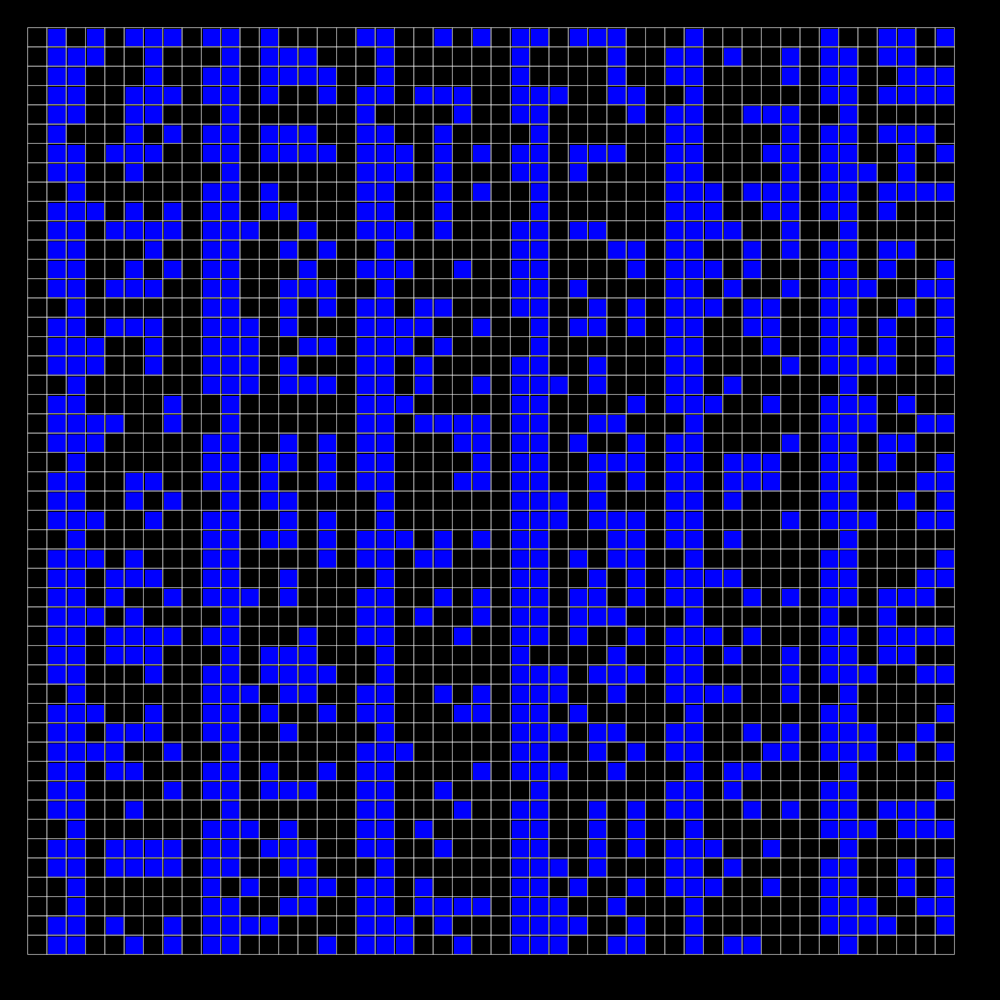

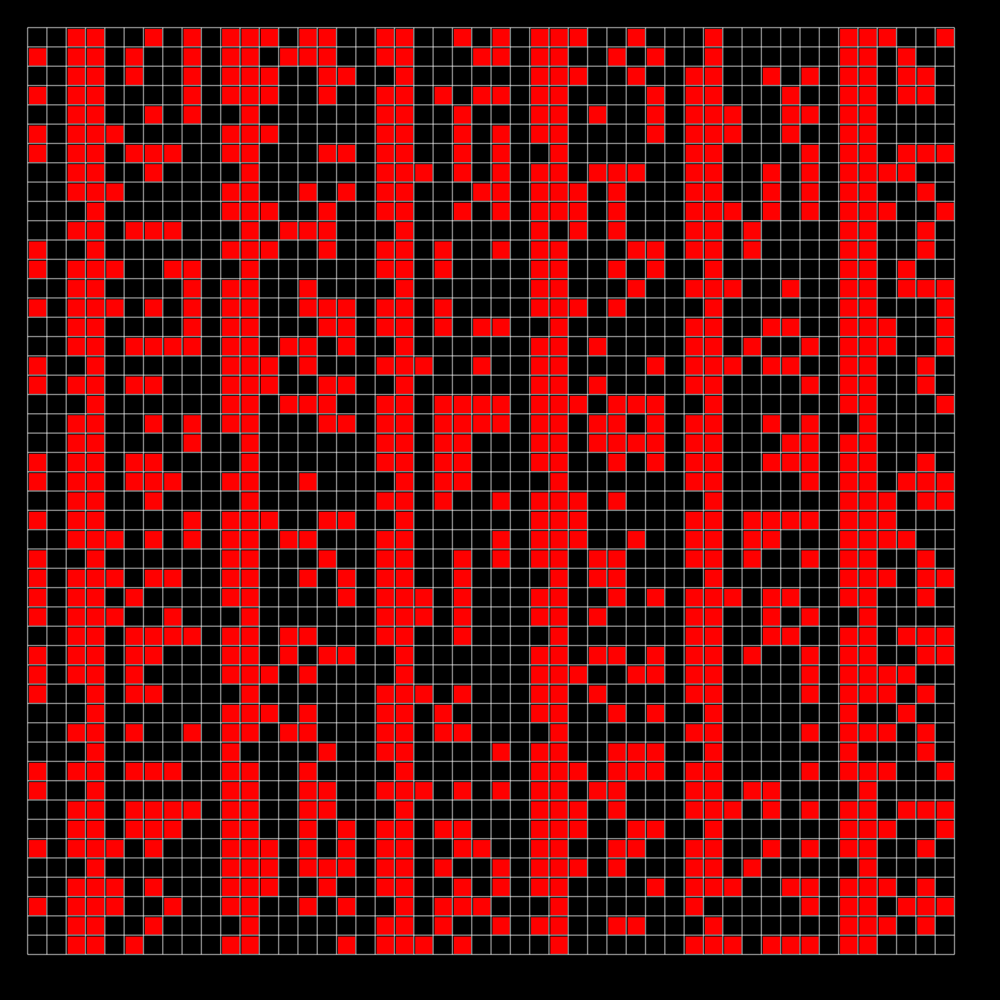

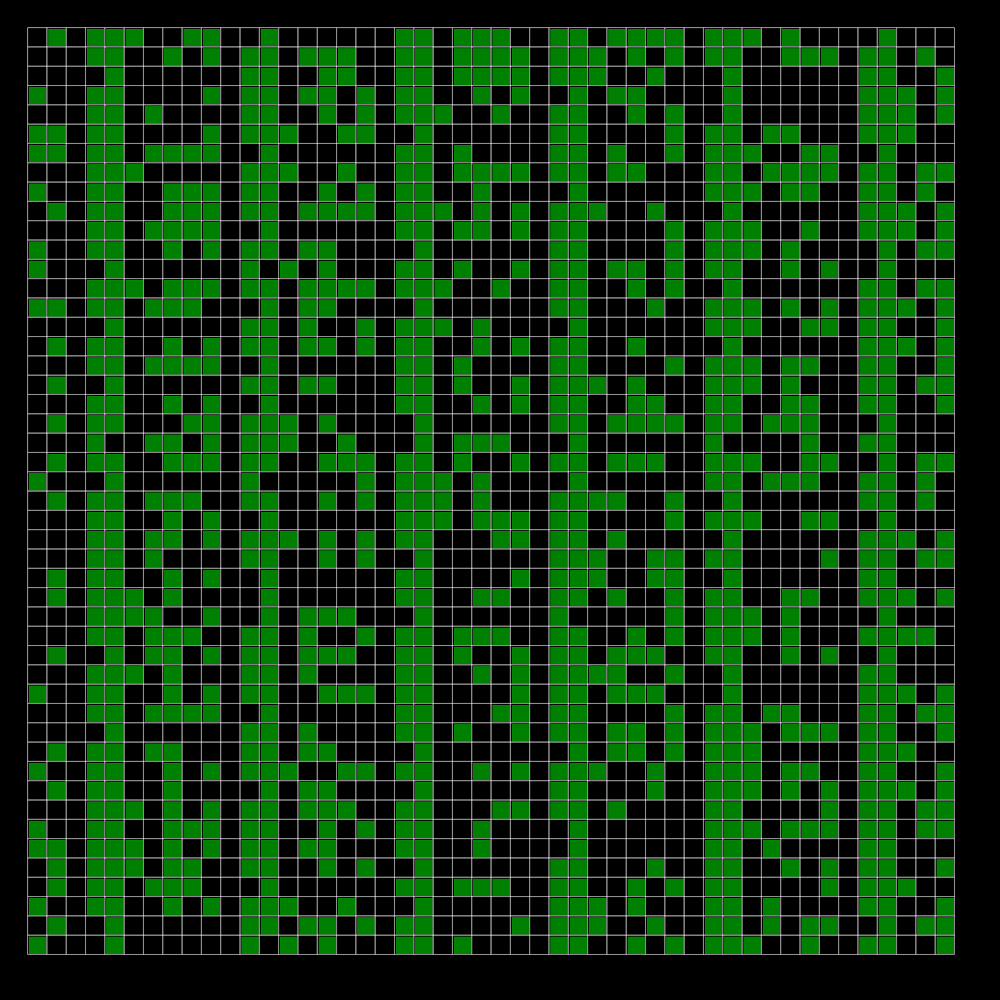

In [ ]:
display("File1.png")
display("File2.png")
display("File3.png")

##Showing multiplex QR code 

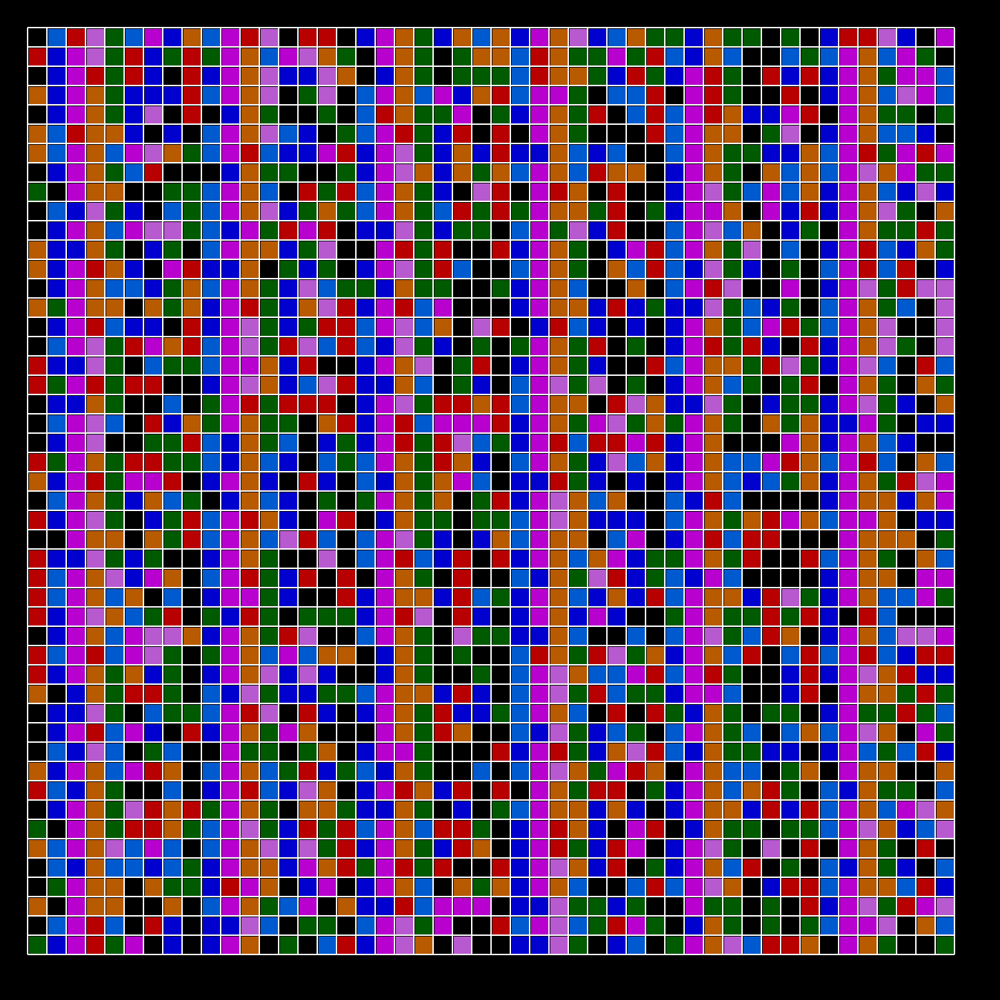

In [ ]:

display("ff.png")

##Showing filter

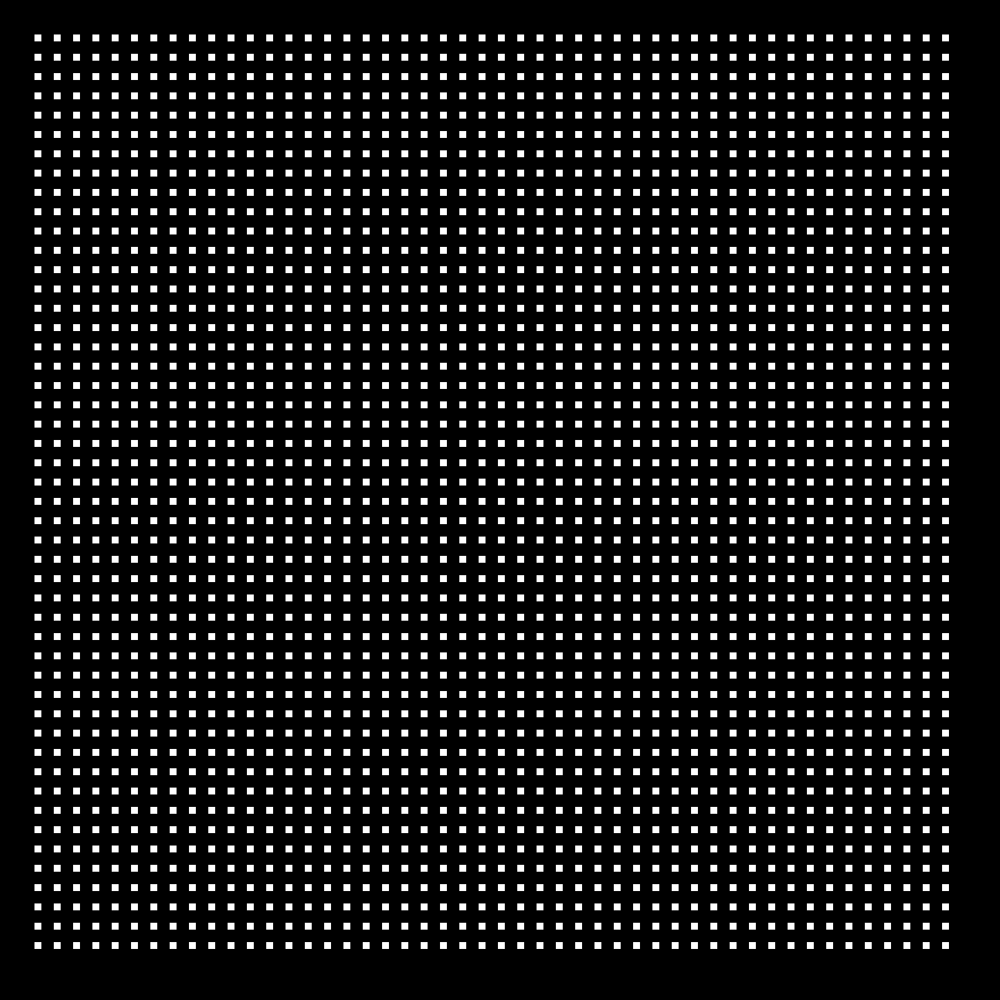

In [ ]:



display("Filter.png")

# Designing a degradation function
> This function is only for our theoretical results. we will first model some common degradation and see if our algorithim is able to detect the data at reciever end. 

## Adding noise
> We are adding Gaussian noise as that is a more probable model to be added when we do the experimental tests. This is because the screens have uniform noise. 


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 142 kB 5.1 MB/s 
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono ghostscript gir1.2-freedesktop
  gir1.2-gdkpixbuf-2.0 gir1.2-rsvg-2.0 gsfonts imagemagick-6-common
  libcairo-script-interpreter2 libcairo2-dev libcupsfilters1 libcupsimage2
  libdjvulibre-dev libdjvulibre-text libdjvulibre21 libgdk-pixbuf2.0-dev
  libgs9 libgs9-common libijs-0.35 libjbig2dec0 liblcms2-dev liblqr-1-0
  liblqr-1-0-dev libmagickcore-6-arch-config libmagickcore-6-headers
  libmagickcore-6.q16-3 libmagickcore-6.q16-3-extra libmagickcore-6.q16-dev
  libmagickwand-6-headers libmagickwand-6.q16-3 libmagick

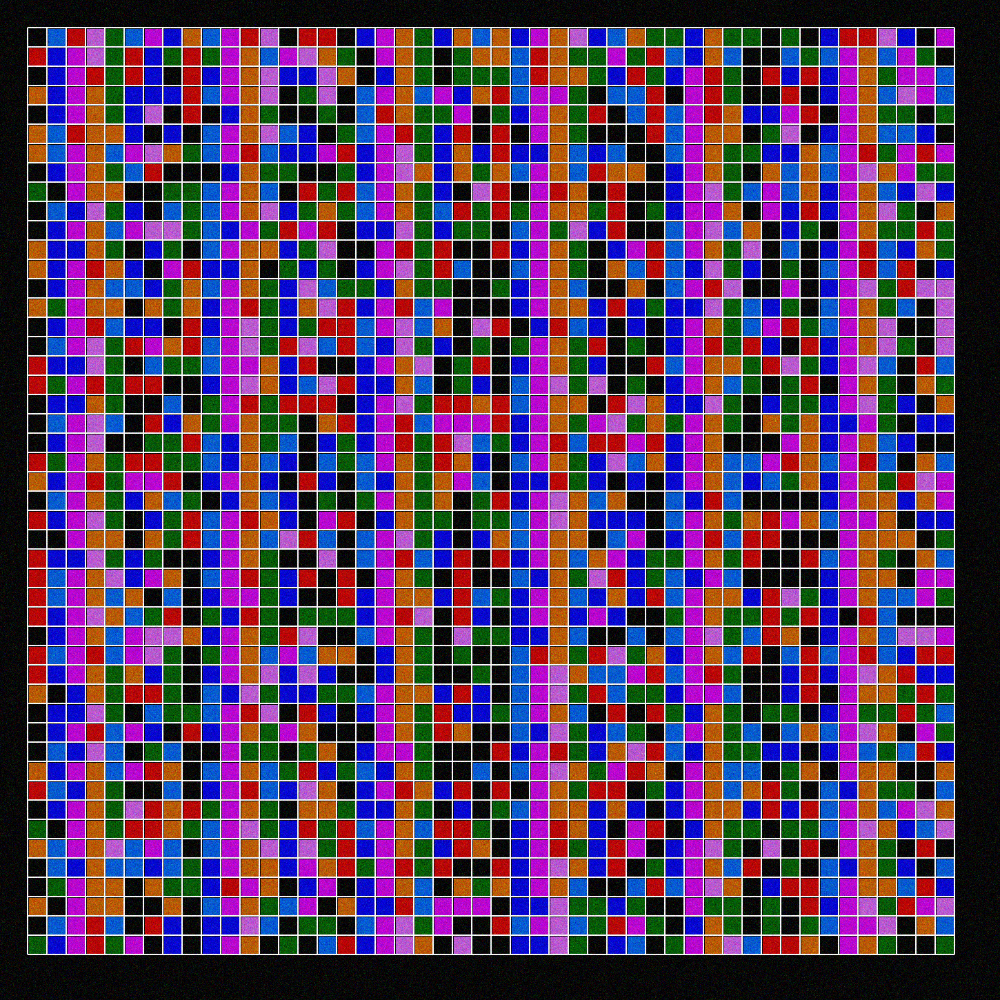

In [ ]:
!pip install wand
!apt-get install libmagickwand-dev
from wand.image import Image
  
# Read image using Image() function
with Image(filename ="ff.png") as img:
  
    # Generate noise image using spread() function
    img.noise("gaussian", attenuate = 0.9)
    img.save(filename ="noisy.png")

display("noisy.png")

# Reciever end processing 

#Gausian smoothing

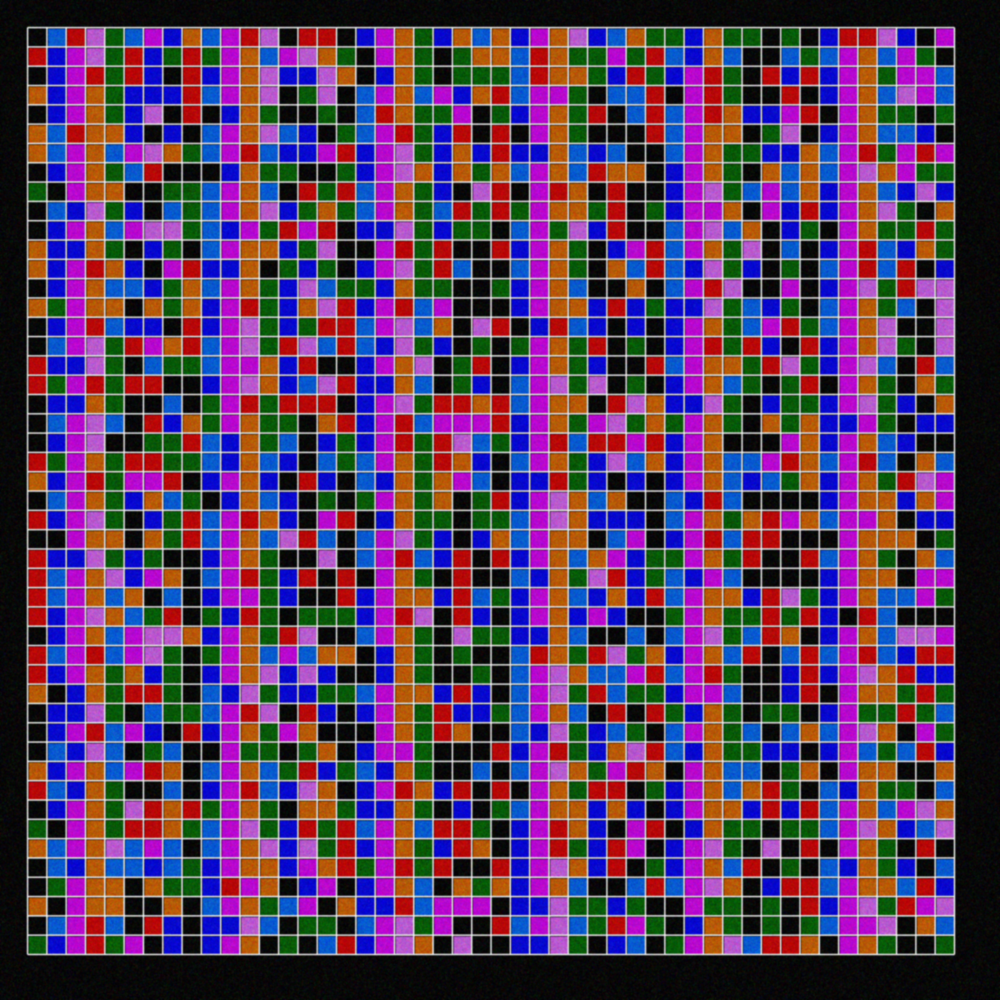

In [ ]:
from PIL import Image, ImageFilter
# Opening the image
# (R prefixed to string in order to deal with '\' in paths)
image = Image.open("noisy.png")
# Blurring image by sending the ImageFilter.
# GaussianBlur predefined kernel argument
image = image.filter(ImageFilter.GaussianBlur(radius=1))
# Displaying the image
image.save("test.png")
display("test.png")

##Demux

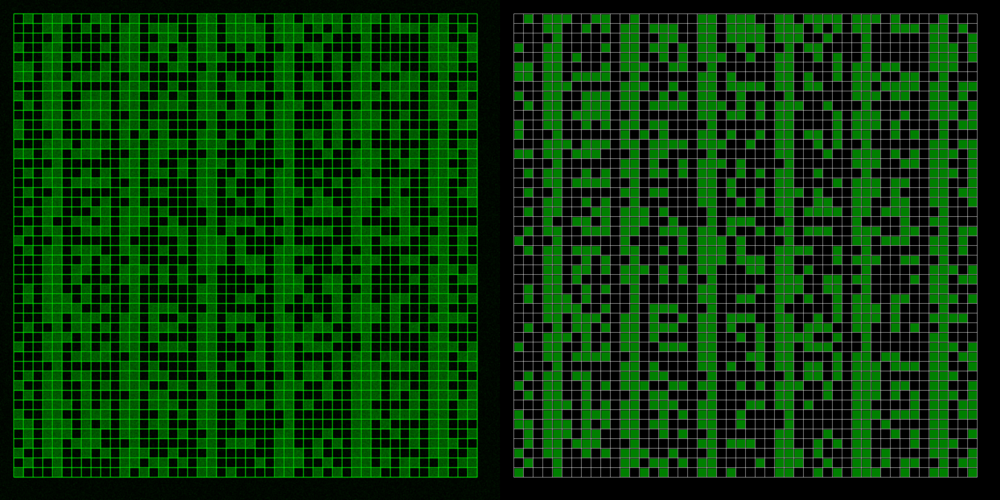

In [ ]:
img1 = cv2.imread('test.png')
imgb = cv2.imread('test.png')
imgr = cv2.imread('test.png')
img2 = cv2.imread('File3.png')

img1[:,:,0]=0
img1[:,:,2]=0

imgb[:,:,2]=0
imgb[:,:,1]=0

imgr[:,:,0]=0
imgr[:,:,1]=0


img3 = cv2.hconcat([img1,img2])

cv2.imwrite("greenR.png" , img1)
cv2.imwrite("blueR.png" , imgb)
cv2.imwrite("redR.png" , imgr)

cv2_imshow(img3)


Right image = orignal  
Left image = recieved image

##Otsu thresholding

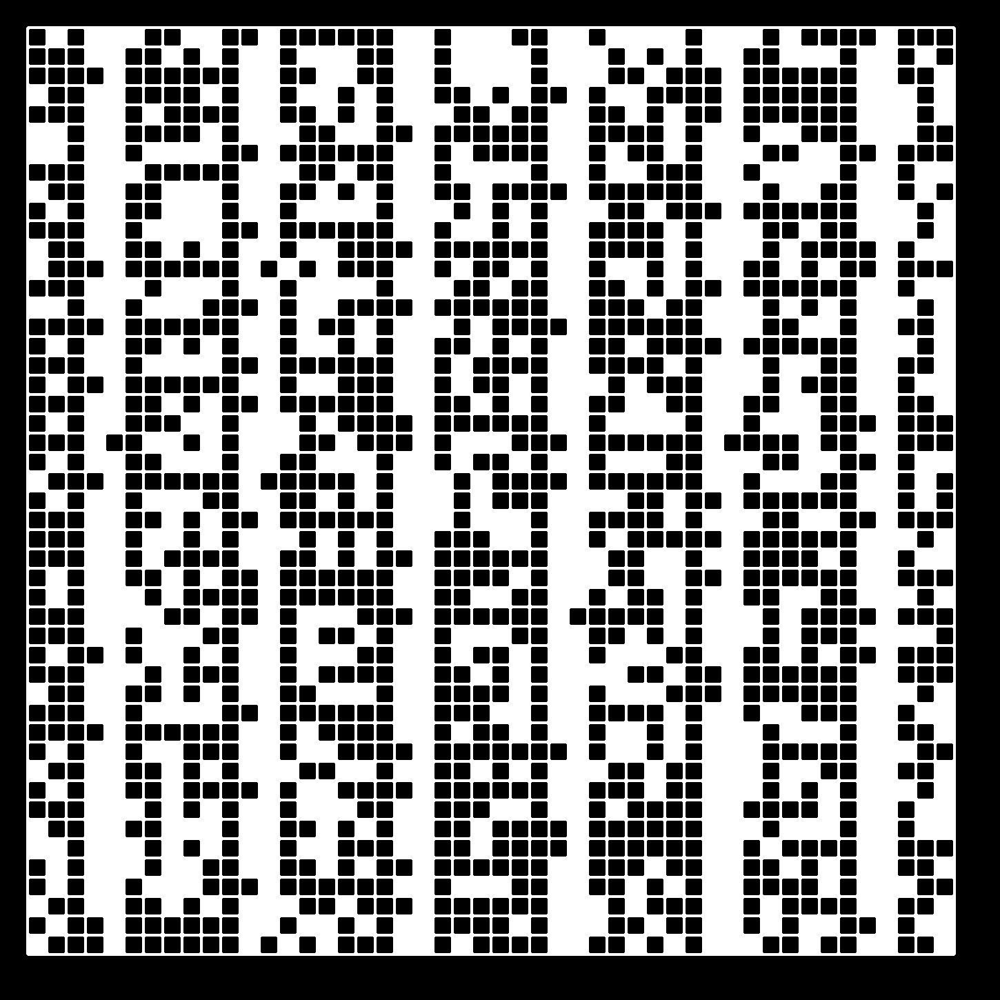

In [ ]:
# Otsu's thresholding after Gaussian filtering
img = cv2.imread('greenR.png')
img1 = cv2.imread('blueR.png')
img3 = cv2.imread('redR.png')

img2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img2 = img2.astype('uint8')
blur = cv2.GaussianBlur(img2,(5,5),0)

img11 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img11 = img11.astype('uint8')
blur1 = cv2.GaussianBlur(img11,(5,5),0)

img33 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
img33 = img33.astype('uint8')
blur3 = cv2.GaussianBlur(img33,(5,5),0)



ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret2,th2 = cv2.threshold(blur1,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret1,th1 = cv2.threshold(blur3,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

cv2.imwrite("thresGreen.png" , th3)
cv2.imwrite("thresblue.png" , th2)
cv2.imwrite("threshred.png" , th1)
cv2_imshow(th3)

##Edge detection using laplacien

>Use in the instance of tranlation of image due to the movement of camera while capturing the video. This will take care of any jitter or movemet by isolating the gride and using it for image registration.

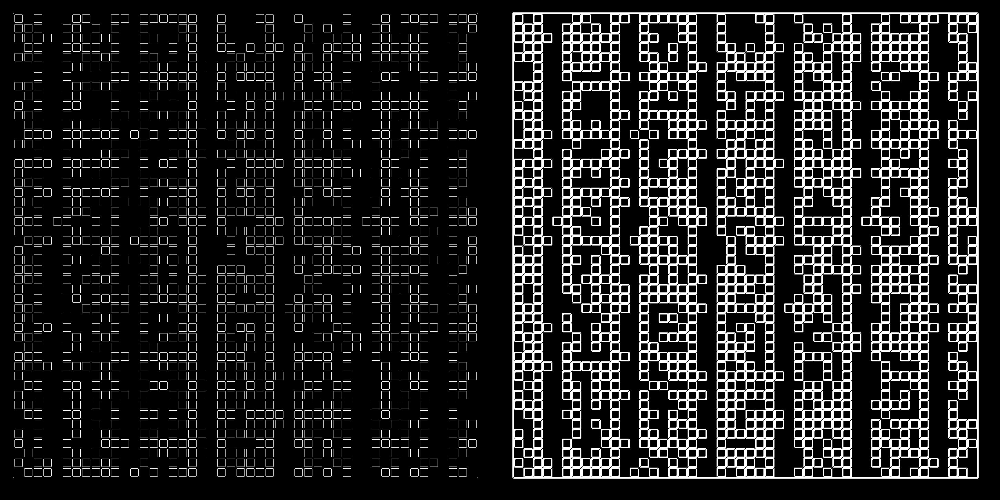

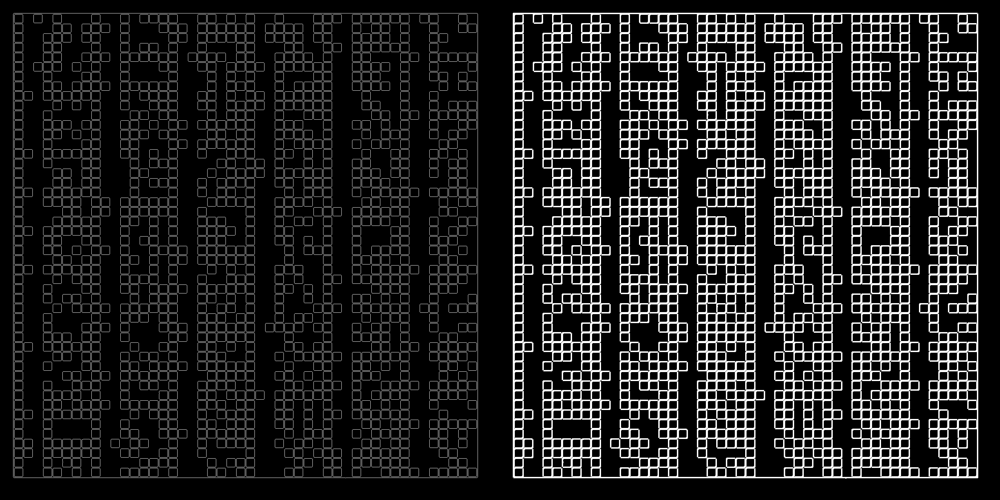

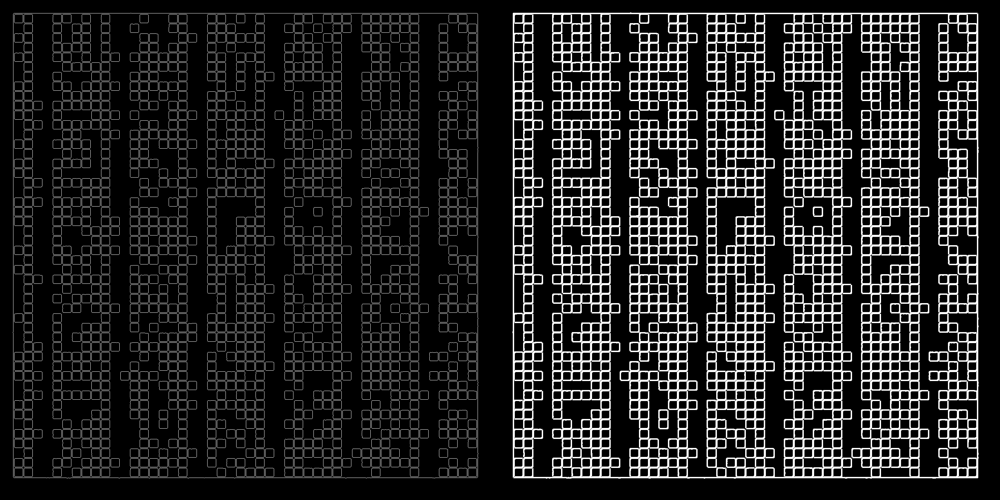

True

In [ ]:

img = cv2.imread('thresGreen.png',0)
laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)
mag = abs(sobelx+sobely)

img3 = cv2.hconcat([laplacian,mag])
cv2_imshow(img3)
cv2.imwrite("edgeGreen.png",mag)


img = cv2.imread('thresblue.png',0)
laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)
mag = abs(sobelx+sobely)

img3 = cv2.hconcat([laplacian,mag])
cv2_imshow(img3)
cv2.imwrite("edgeblue.png",mag)


img = cv2.imread('threshred.png',0)
laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)
mag = abs(sobelx+sobely)

img3 = cv2.hconcat([laplacian,mag])
cv2_imshow(img3)
cv2.imwrite("edgered.png",mag)

Left: Laplacien 
RightL sobel Magnitude

##Getting Values from QR 

> To extract the binary information we are using a filter to center all values, this will remove any noise or distortions present in the image that havent been filtered out in the presvious stages. This process is robust as it takes grid of values that represnt each bit in the final bit stream hence in the next step when we extract each square, we will be taking a mean, this would ensure each bit is accurate. As we decrease the grid size the total area decreases hence our ability to do error correction would decrease but this would only matter in extream noisy situations, at that point we can anyways keep the grid size as large as the one we have right now.

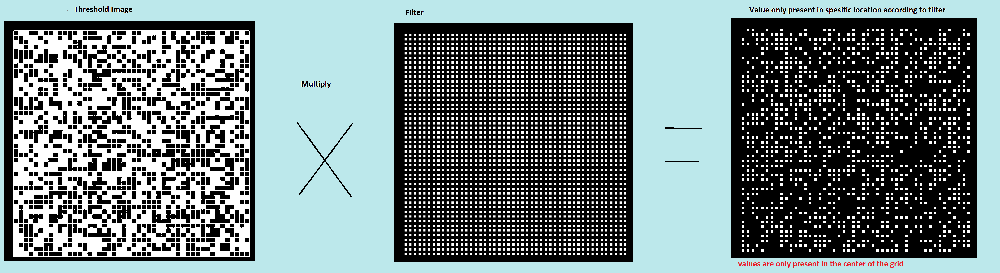

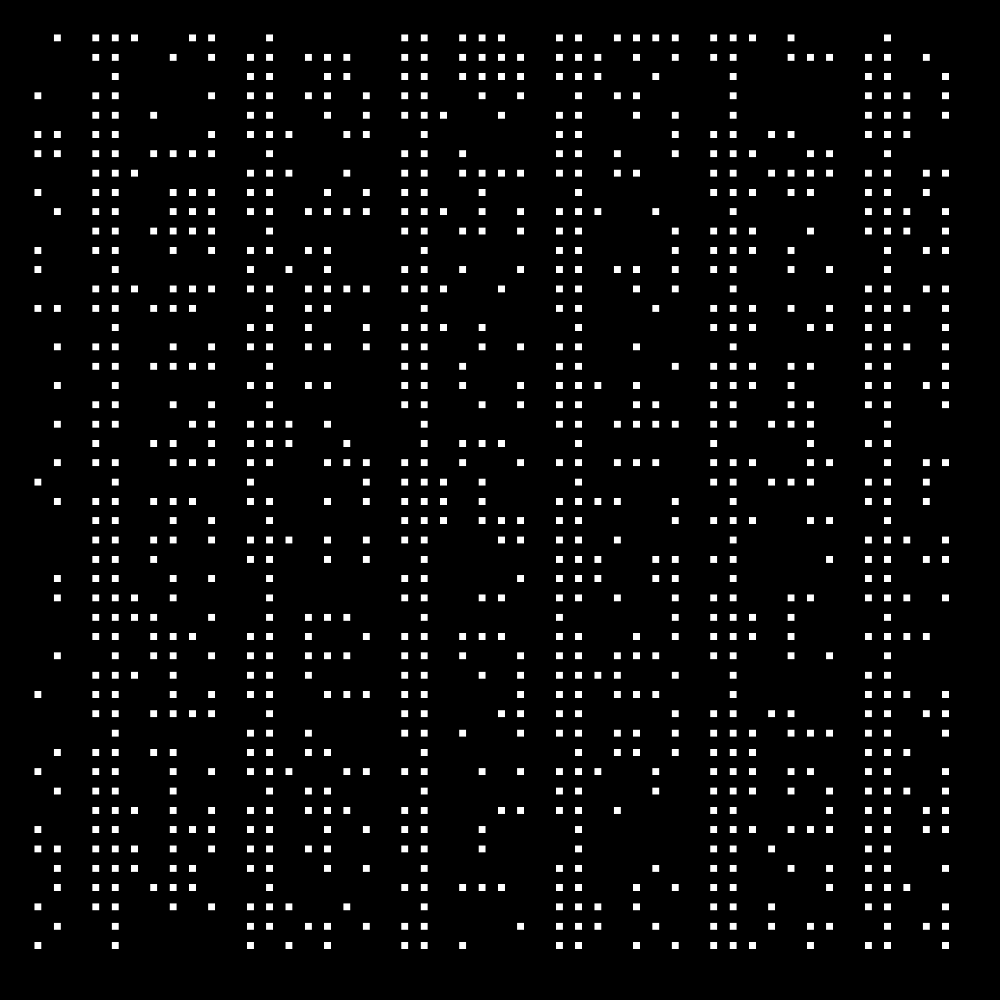

filter superimposed on image showing zeros and ones


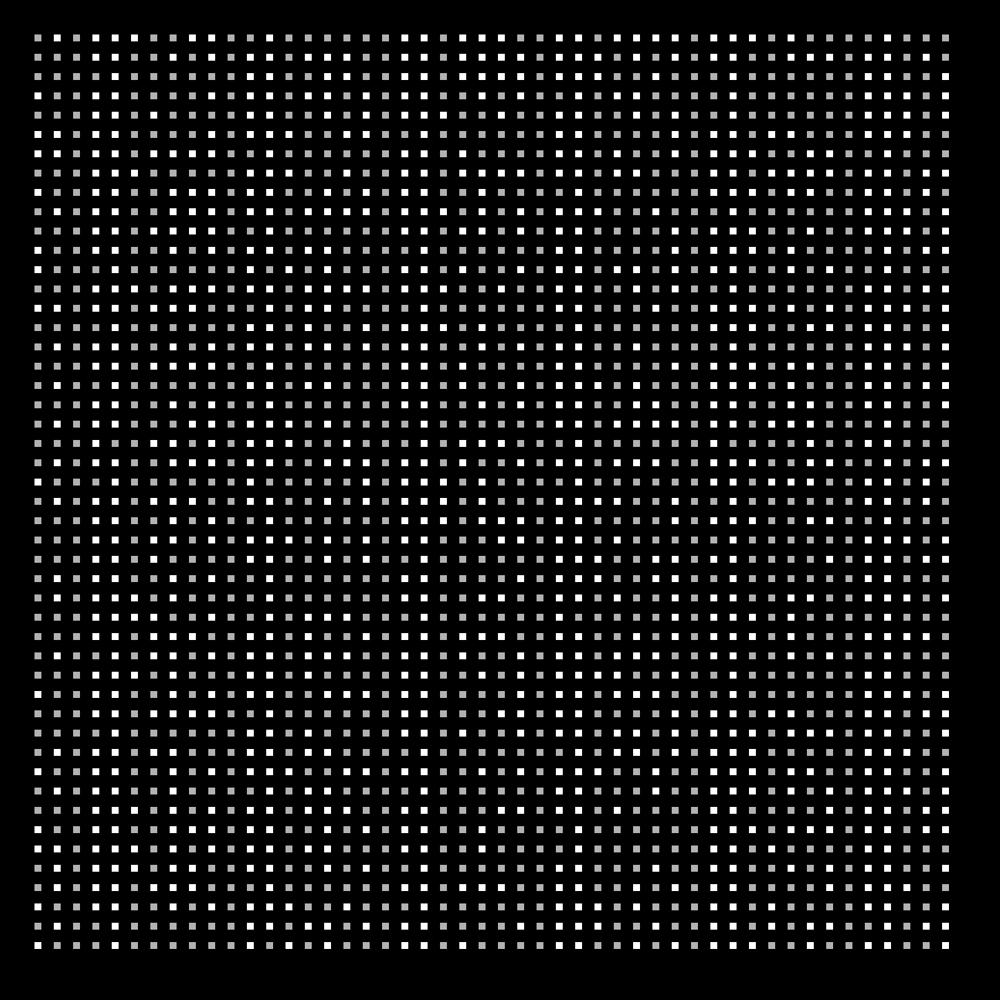

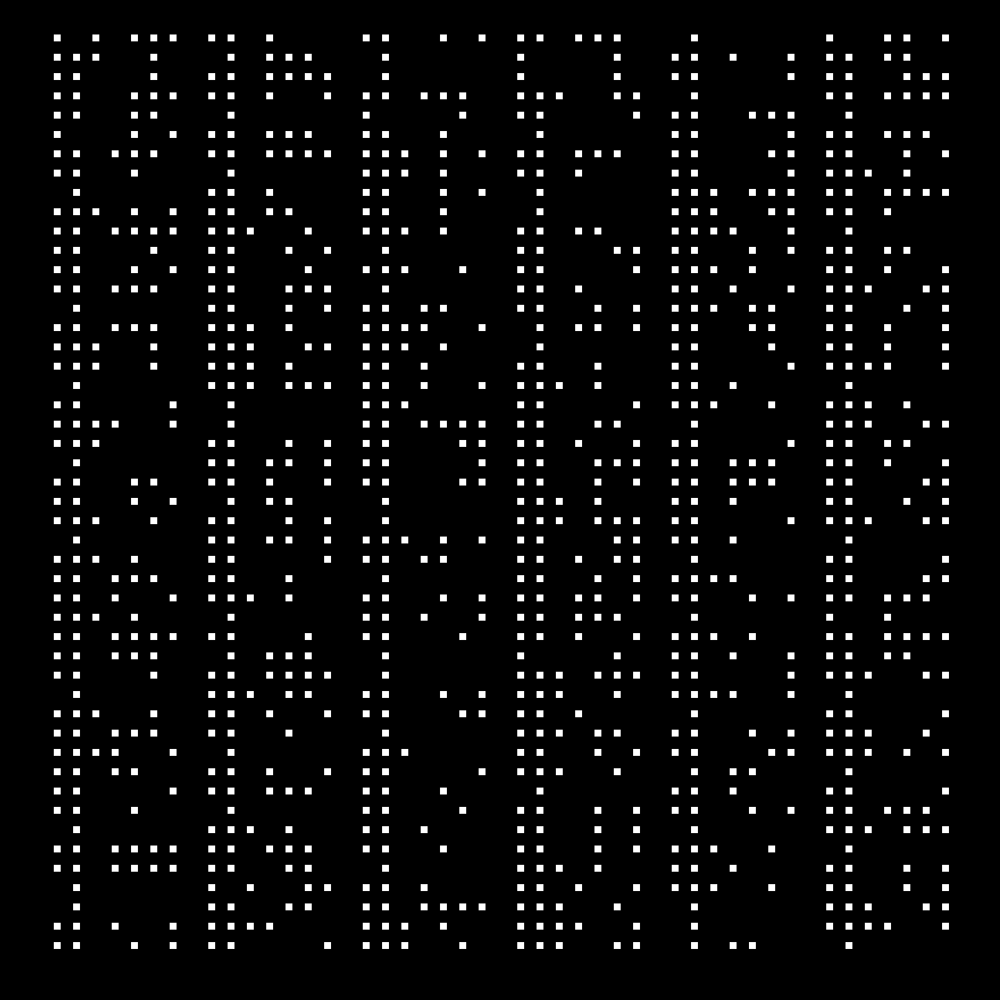

filter superimposed on image showing zeros and ones


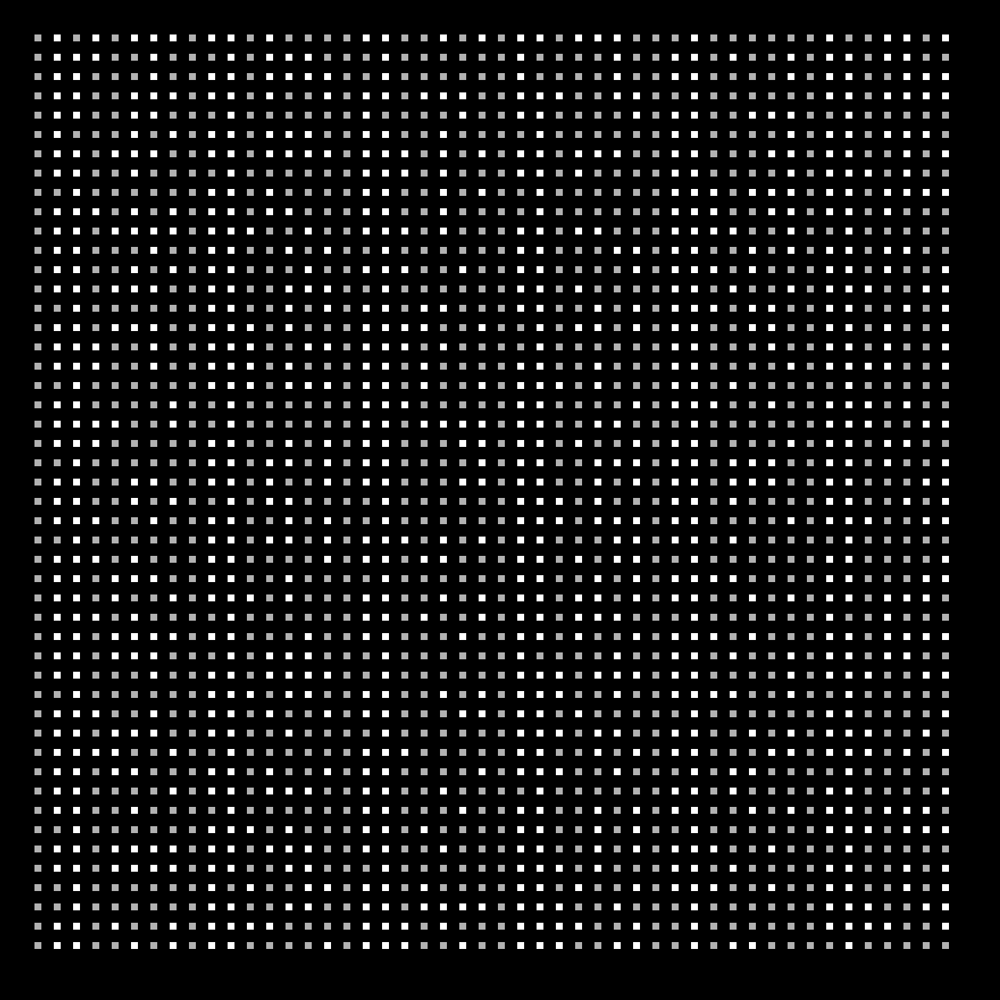

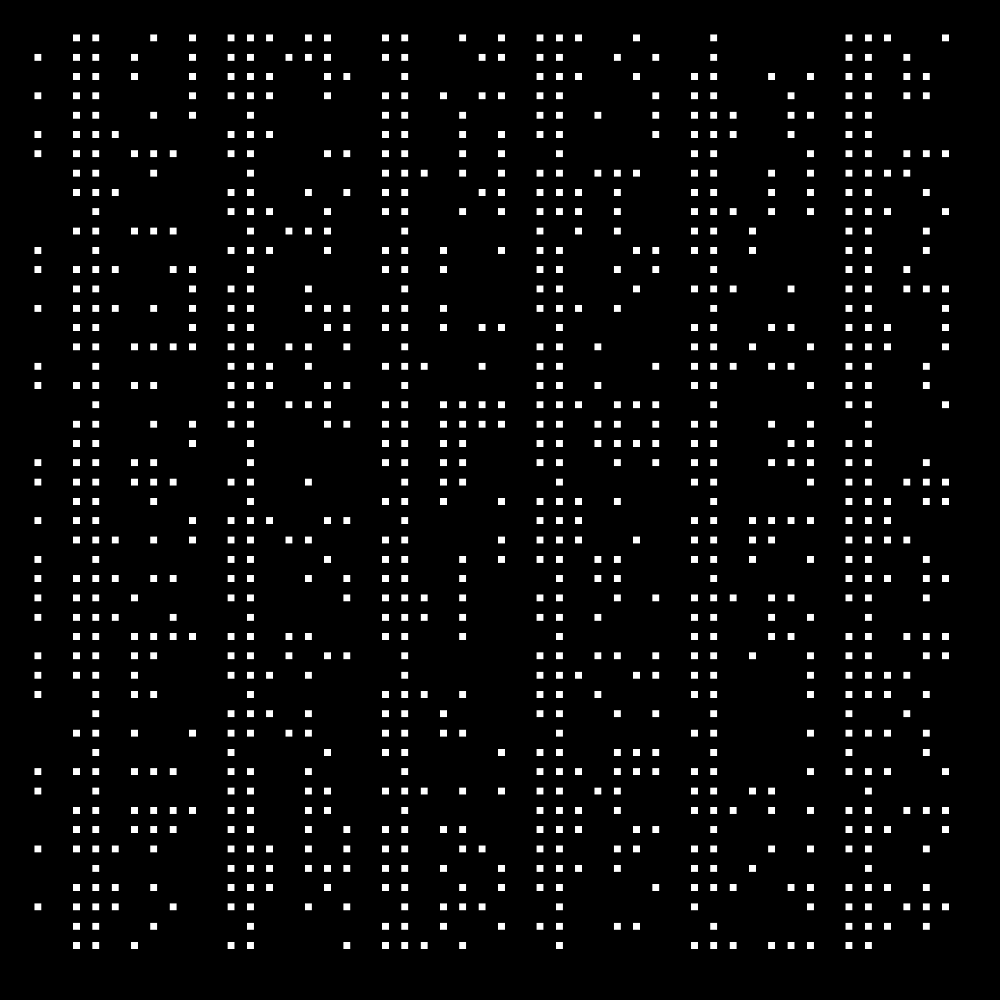

filter superimposed on image showing zeros and ones


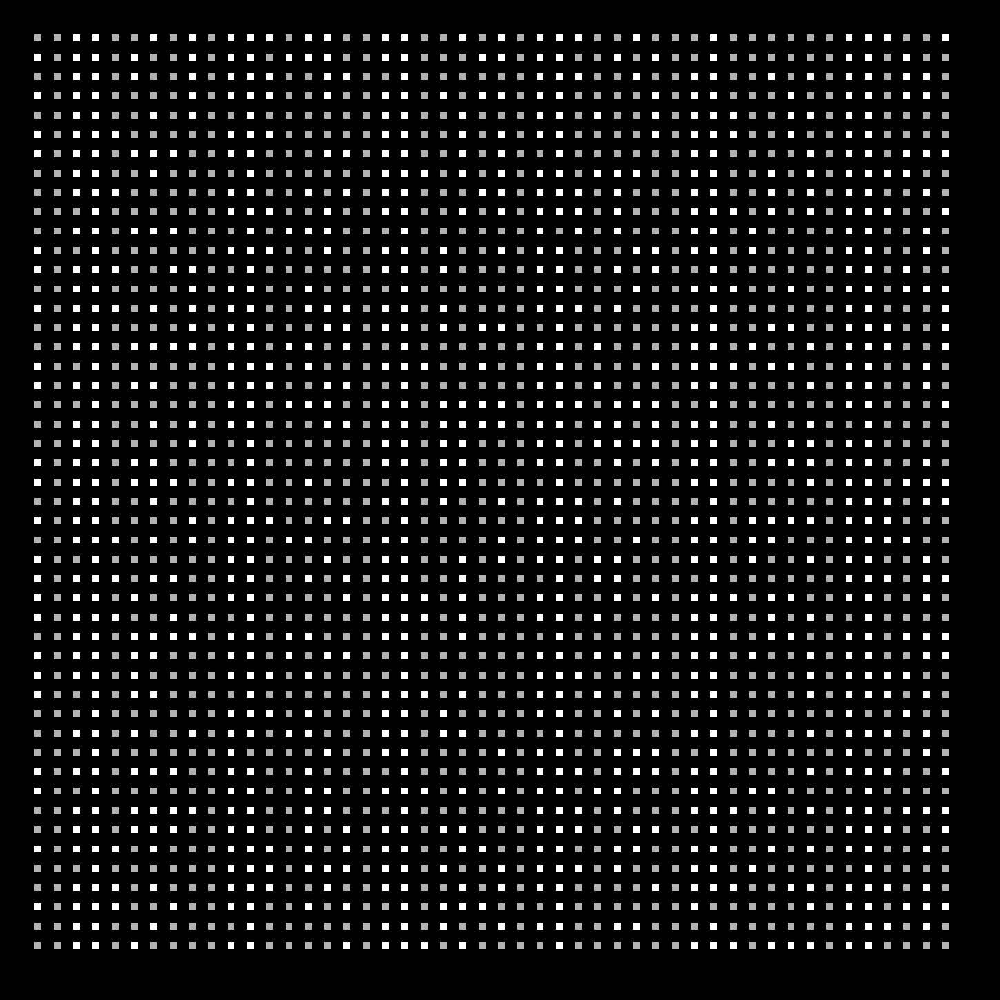

In [ ]:

img1 = cv2.imread('thresGreen.png')
img2 = cv2.imread('Filter.png')

dst= cv2.multiply(img1,img2,0.2)
dst2= cv2.addWeighted(dst,0.9,img2,0.7,0)
cv2.imwrite('green_extract.png', dst)
cv2_imshow(dst)
print("filter superimposed on image showing zeros and ones")
cv2_imshow(dst2)


img1 = cv2.imread('thresblue.png')
img2 = cv2.imread('Filter.png')

dst= cv2.multiply(img1,img2,0.2)
dst2= cv2.addWeighted(dst,0.9,img2,0.7,0)
cv2.imwrite('blue_extract.png', dst)
cv2_imshow(dst)
print("filter superimposed on image showing zeros and ones")
cv2_imshow(dst2)



img1 = cv2.imread('threshred.png')
img2 = cv2.imread('Filter.png')

dst= cv2.multiply(img1,img2,0.2)
dst2= cv2.addWeighted(dst,0.9,img2,0.7,0)
cv2.imwrite('red_extract.png', dst)
cv2_imshow(dst)
print("filter superimposed on image showing zeros and ones")
cv2_imshow(dst2)

In [ ]:
import pandas as pd
import numpy as np
img = cv2.imread('Filter.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img = img.astype('uint8')

df = pd.DataFrame(img) 
# isolating the first bit using the filter as a reference, 
# first bit starts from 64 and there are 13X13 bits of info representing one bit  

pd.set_option('max_colwidth', 400)
pd.describe_option('max_colwidth')
df





display.max_colwidth : int or None
    The maximum width in characters of a column in the repr of
    a pandas data structure. When the column overflows, a "..."
    placeholder is embedded in the output. A 'None' value means unlimited.
    [default: 50] [currently: 400]


,0,1,2,3,4,5,6,7,8,9,...,1440,1441,1442,1443,1444,1445,1446,1447,1448,1449
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1445,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1446,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1447,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1448,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
import pandas as pd
img = cv2.imread('blue_extract.png')
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
out = cv2.normalize(img2.astype('int32'), None, 0.0, 1.0, cv2.NORM_MINMAX)
size1 = len(out[:]) # same size since square
print("size of matrix: " + str(size1))
temp=[]
data=[]
for i in range(64,size1,28):
  for j in range(64,size1,28):
    sum_filter = out[i+1:i+15,j+1:j+15]
    value = max(map(lambda x: max(x), sum_filter)) 
    temp.append(value)  
  data.append(temp)
  temp=[]
print(data)

index=0;
data_temp=[]
data_lst=[]
k=0
i=0
j=0
for k in range(49):
  if k == 47:
    continue
  for i in range(6):
    for j in range(8):
      index= (i*8)+j
      if (index == 46):
        data_temp.append(data[k][47])
      elif (index == 47):
        data_temp.append(data[k][48])
      else:
      
        data_temp.append(data[k][index])
    data_lst.append(data_temp)
    data_temp=[]

print(data_lst)

final_data_blue=[]
for i in range(49):
  final_data_blue.append(int(''.join(map(lambda x: str(x), data_lst[i])),2))


img = cv2.imread('red_extract.png')
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
out = cv2.normalize(img2.astype('int32'), None, 0.0, 1.0, cv2.NORM_MINMAX)
size1 = len(out[:]) # same size since square
print("size of matrix: " + str(size1))
temp=[]
data=[]
for i in range(64,size1,28):
  for j in range(64,size1,28):
    sum_filter = out[i+1:i+15,j+1:j+15]
    value = max(map(lambda x: max(x), sum_filter)) 
    temp.append(value)  
  data.append(temp)
  temp=[]
print(data)

index=0;
data_temp=[]
data_lst=[]
k=0
i=0
j=0
for k in range(49):
  if k == 47:
    continue
  for i in range(6):
    for j in range(8):
      index= (i*8)+j
      if (index == 46):
        data_temp.append(data[k][47])
      elif (index == 47):
        data_temp.append(data[k][48])
      else:
      
        data_temp.append(data[k][index])
    data_lst.append(data_temp)
    data_temp=[]

print(data_lst)

final_data_red=[]
for i in range(49):
  final_data_red.append(int(''.join(map(lambda x: str(x), data_lst[i])),2))


img = cv2.imread('green_extract.png')
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
out = cv2.normalize(img2.astype('int32'), None, 0.0, 1.0, cv2.NORM_MINMAX)
size1 = len(out[:]) # same size since square
print("size of matrix: " + str(size1))
temp=[]
data=[]
for i in range(64,size1,28):
  for j in range(64,size1,28):
    sum_filter = out[i+1:i+15,j+1:j+15]
    value = max(map(lambda x: max(x), sum_filter)) 
    temp.append(value)  
  data.append(temp)
  temp=[]
print(data)

index=0;
data_temp=[]
data_lst=[]
k=0
i=0
j=0
for k in range(49):
  if k == 47:
    continue
  for i in range(6):
    for j in range(8):
      index= (i*8)+j
      if (index == 46):
        data_temp.append(data[k][47])
      elif (index == 47):
        data_temp.append(data[k][48])
      else:
      
        data_temp.append(data[k][index])
    data_lst.append(data_temp)
    data_temp=[]

print(data_lst)

final_data_green=[]
for i in range(49):
  final_data_green.append(int(''.join(map(lambda x: str(x), data_lst[i])),2))

final_data = final_data_blue+ final_data_red+final_data_green
print(final_data)

string=""
for i in final_data_green:
  string=string+chr(i)
print(string)


size of matrix: 1450
[[1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0], [1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0,

In [ ]:
import cv2
import numpy as np
import math

from PIL import Image as im

startdecoding = timer()

# Load the image using OpenCV
img = cv2.imread("green_extract.png",cv2.IMREAD_GRAYSCALE)

kernel =  [[1 for i in range(10)] for j in range (10)]
kernel = np.array(kernel,dtype="int")

output = cv2.morphologyEx(np.array(img,dtype="uint8"), cv2.MORPH_HITMISS,kernel)

cv2.imwrite('outputgreen'+'.png', output)


lstgreen = []
for i in range(55,28*48+55,28):
    lst2 = []
    for j in range(55,28*49+55,28):
        if output[i][j]:
            lst2.append(1)
        else: lst2.append(0)
    lstgreen.append(lst2)




img = cv2.imread("red_extract.png",cv2.IMREAD_GRAYSCALE)

kernel =  [[1 for i in range(10)] for j in range (10)]
kernel = np.array(kernel,dtype="int")

output = cv2.morphologyEx(np.array(img,dtype="uint8"), cv2.MORPH_HITMISS,kernel)

cv2.imwrite('outputred'+'.png', output)


lstred = []
for i in range(55,28*48+55,28):
    lst2 = []
    for j in range(55,28*49+55,28):
        if output[i][j]:
            lst2.append(1)
        else: lst2.append(0)
    lstred.append(lst2)




img = cv2.imread("blue_extract.png",cv2.IMREAD_GRAYSCALE)

kernel =  [[1 for i in range(10)] for j in range (10)]
kernel = np.array(kernel,dtype="int")

output = cv2.morphologyEx(np.array(img,dtype="uint8"), cv2.MORPH_HITMISS,kernel)

cv2.imwrite('outputblue'+'.png', output)


lst = []
for i in range(55,28*48+55,28):
    lst2 = []
    for j in range(55,28*49+55,28):
        if output[i][j]:
            lst2.append(1)
        else: lst2.append(0)
    lst.append(lst2)






words=""
for i in range(47):
    for j in range(6):
        v= lst[i][j*8:j*8+8]
        string = ''.join(map(lambda x: str(x), v))
        value = chr(int(string,2))
        words+=value



for i in range(47):
    for j in range(6):
        v= lstred[i][j*8:j*8+8]
        string = ''.join(map(lambda x: str(x), v))
        value = chr(int(string,2))
        words+=value


for i in range(47):
    for j in range(6):
        v= lstgreen[i][j*8:j*8+8]
        string = ''.join(map(lambda x: str(x), v))
        value = chr(int(string,2))
        words+=value
enddecoding = timer()
print(enddecoding - startdecoding)
print("Result after decoding:")
print(words)

0.12610844299999258
Result after decoding:
When Mr. Bilbo Baggins of Bag End announced that he would shortly be celebrating his eleventy-first birthday with a party of special magnificence, there was much talk and excitement in Hobbiton. Bilbo was very rich and very peculiar, and had been the wonder of the Shire for sixty y2»2¹9´·1²44¹92¶°¹5°±6224¹°¸82°¹0·1²0·2:·2¼82±º2²92º:¹7*4294±´2¹4240²197º³´:10±µ397¶44¹:90»2¶940²77»12±·¶²067±°¶62³²·20·24º;°¹87¸:¶0¹6<12¶4²»2²;´0º2»2¹:427¶237¶56´³´:9°¼:40º:42$4¶60º!0³"·2;°¹3:¶67³::·72¶99º:³32²;´º4:92°¹º¹2 ·24³:\ÈÝ[ÝYÚÜ[YK\HØ\È[ÛÈ\ÈÛÛÙYYÛÝ\ÈX\[][YHÛÜHÛ]]ÙY[YYÈ]H]HYXÝÛ\YÙÚ[Ë][]HHØ\È]XÚHØ[YH\È]YK][]K[[H^HYØ[ÈØ[[]Ù[\\Ù\Y][Ú[ÙYÛÝ[]HY[X\\HX\Ë


##Decompressing data

In [ ]:
def decompress(bit_stream):
    
  # lst_bitjoin=[]

  # for i in range(0,len(bit_stream),8):
  #     lst_bitjoin.append(int(bit_stream[i:i+8],2))

  # print(lst_bitjoin)


  kk= bytes(bit_stream)

  f= zlib.decompress(kk)

  print(f.decode("UTF-8"))

##Comparing data (Hash comparision)

In [ ]:

import hashlib
  
 
def hashfile(file):
  

    BUF_SIZE = 65536
    sha256 = hashlib.sha256()

    with open(file, 'rb') as f:
         
        while True:
      
            data = f.read(BUF_SIZE)
  
            if not data:
                break
      
          
            sha256.update(data)
  
    return sha256.hexdigest()
 
f1_hash = hashfile("data.txt")
f2_hash = hashfile("data1.txt") # <- add the second file after processing image
  

if f1_hash == f2_hash:
    print("Both files are same")
    print(f"Hash: {f1_hash}")
 
else:
    print("Files are different!")
    print(f"Hash of File 1: {f1_hash}")
    print(f"Hash of File 2: {f2_hash}")

Both files are same
Hash: 179bc95741d1d988593dae4b8accff600cfdb76bbaac6522ae377556f50ac32e
